# Lab 2: Clustering

Welcome to the advanced Machine Learning Course.

The objective of this lab session is to code a few regression algorithms and to apply them to synthetic and real datasets.

Please put **"ML - MDS - TD2"** in the mail subject or I might lose your work (which means 0) and send it to pierre.houdouin@centralesupelec.fr

Please label your notebook **"L2_familyname1_familyname2.ipynb"** or I might lose your work (which means 0).

We begin with the standard imports:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster # all clustering techniques except hdbscan
%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

We will have two toy datasets to try the different methods:

There are a lot of clustering algorithms to choose from the `sklearn` library. So what clustering algorithms should you be using? It depends.

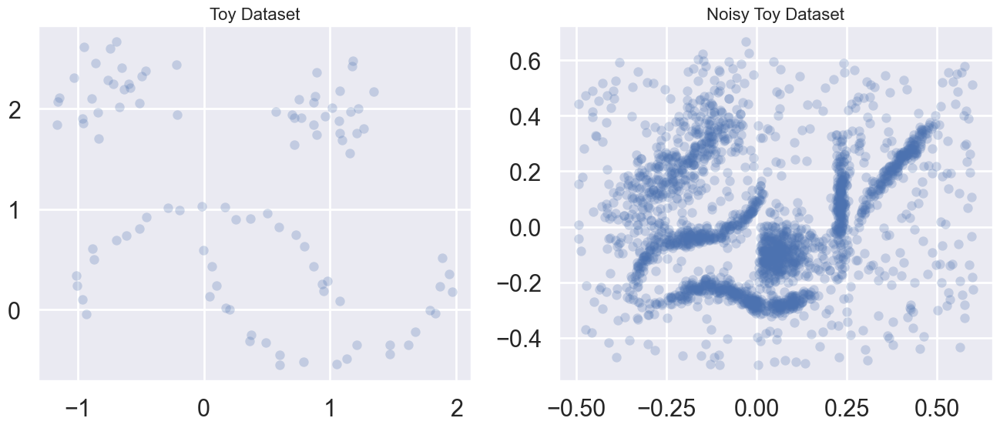

In [2]:
import sklearn.datasets as data
moons, _ = data.make_moons(n_samples=50, noise=0.05)
blobs, _ = data.make_blobs(n_samples=50, centers=[(-0.75,2.25), (1.0, 2.0)], cluster_std=0.25)
test_data_0 = np.vstack([moons, blobs])

test_data_1 = np.load('clusterable_data.npy')

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_0.T[0], test_data_0.T[1], c='b', **plot_kwds)
ax[0].set_title('Toy Dataset', size=16)

ax[1].scatter(test_data_1.T[0], test_data_1.T[1], color='b', **plot_kwds)
ax[1].set_title('Noisy Toy Dataset', size=16)

plt.show();

## K-means

K-Means is the 'go-to' clustering algorithm for many simply because it is fast, easy to understand, and available everywhere (there's an implementation in almost any statistical or machine learning tool you care to use). However, K-Means has a few problems caused by its simplicity. 

We try the `sklearn` implementation in our toy datasets:

## Aglomerative Single Linkage clustering

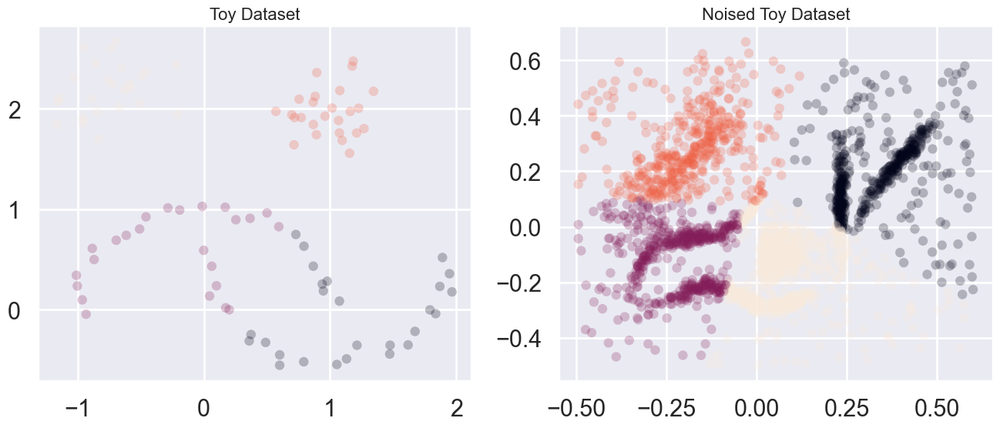

In [3]:
from sklearn.cluster import KMeans
kmeans_0 = KMeans(n_clusters=4, max_iter=200).fit(test_data_0)
kmeans_1 = KMeans(n_clusters=4, max_iter=200).fit(test_data_1)

fig, ax = plt.subplots(1, 2, figsize=(16, 6))
ax[0].scatter(test_data_0.T[0], test_data_0.T[1], c=kmeans_0.labels_ , **plot_kwds)
ax[0].set_title('Toy Dataset', size=16)

ax[1].scatter(test_data_1.T[0], test_data_1.T[1], c=kmeans_1.labels_, **plot_kwds)
ax[1].set_title('Noised Toy Dataset', size=16)


plt.show();

Agglomerative clustering is a suite of algorithms all based on the same idea. The fundamental idea is that you start with each point in it's own cluster and then, for each cluster, use some criterion to choose another cluster to merge with. Do this repeatedly until you have only one cluster and you get get a hierarchy, or binary tree, of clusters branching down to the last layer which has a leaf for each point in the dataset. The most basic version of this, single linkage, chooses the closest cluster to merge, and hence the tree can be ranked by distance as to when clusters merged/split.

**Code your own Aglomerative Single Linkage clustering algorithm**!:

- Fill in the class 
- During the process, keep track of the cluster merges by saving a (num_samples-1,4) np.array being a linkage matrix in scypy format (to use their function to plot dendrogram: `scipy.cluster.hierarchy.dendrogram`). check documentation.

In [4]:
class my_SingleLinkageAglomerativeClustering():
    
    def __init__(self, metric="euclidean", n_clusters=3):
        '''
        Attributes:
        
        metric_: {"euclidean","precomputed"}
            the distance to be used
            if precomputed then X is distance matrix
        n_clusters: integer
            number of clusters to return 
        linkage_matrix_: (n-1, 4) np.array
            in the same format as linkage  
        labels_: integer np.array
            label assigment
        hierarchy_: list of np.array
            each array corresponds to label assigment
            at each level (number of clusters)
            hierarchy_[0]=np.array(list(range(n)))
        '''
        self.metric_ = metric
        self.n_clusters_ = n_clusters
        self.linkage_matrix_ = None
        self.labels_ = None
        self.hierarchy_ = None
        
    def fit(self, X):
        """ Create a hierarchy of clusters
        
        Parameters:
        -----------
        X: (n, p) np.array
            Data matrix
        
        Returns:
        -----
        self: my_SingleLinkageAglomerativeClustering
            to have access to labels_
        """
        # if it's not precomputed compute the distance matrix
        from scipy.spatial import distance 
        if self.metric_ != "precomputed":
            d_matrix = distance.cdist(X, X, metric=self.metric_)
        else:
            d_matrix = X
        n, _ = X.shape
        # HINT:
        # You can use a minimum spanning tree and add merge in increasing order
        # or modifying the distance matrix 
        # (add row/column for new clusters and remove/put zero in old row/colums)
        # keep track of merges in linkage_matrix_ and labels in hierarchy_
        # update labels_ from the hierarchy level selected by n_clusters_ 
        
        # initialisation
        
        clusters = {i: [i] for i in range(n)}
        self.linkage_matrix_ = np.zeros((n-1, 4))  # There will be n-1 merges
        self.hierarchy_ = [np.arange(n)]
            
        for iteration in range(n-1):
            # Find the closest two clusters based on single linkage (minimum distance)
            min_dist = np.inf
            to_merge = (-1, -1)  # Indices of clusters to merge
            
            # finding the pair with the minimum distance
            cluster_keys = list(clusters.keys())
            for i in range(len(cluster_keys)):
                for j in range(i+1, len(cluster_keys)):
                    cluster_i, cluster_j = cluster_keys[i], cluster_keys[j]
                    # Get minimum distance between points in cluster_i and cluster_j
                    for point_i in clusters[cluster_i]:
                        for point_j in clusters[cluster_j]:
                            if d_matrix[point_i, point_j] < min_dist:
                                min_dist = d_matrix[point_i, point_j]
                                to_merge = (cluster_i, cluster_j)
                                
            # Merge the two clusters (to_merge[0] and to_merge[1])
            new_cluster = max(clusters.keys()) + 1  # New cluster index
            clusters[new_cluster] = clusters[to_merge[0]] + clusters[to_merge[1]]
            
            # Update the linkage matrix
            self.linkage_matrix_[iteration, 0] = to_merge[0] 
            self.linkage_matrix_[iteration, 1] = to_merge[1]  
            self.linkage_matrix_[iteration, 2] = min_dist  # Distance 
            self.linkage_matrix_[iteration, 3] = len(clusters[new_cluster]) # Size 
            
            # Remove the old clusters
            del clusters[to_merge[0]]
            del clusters[to_merge[1]]
            
            # Update hierarchy: Assign new labels after the merge
            new_labels = self.hierarchy_[-1].copy()
            new_labels[np.isin(new_labels, [to_merge[0], to_merge[1]])] = new_cluster
            self.hierarchy_.append(new_labels)
        
        # Select the final labels based on the number of desired clusters
        self.labels_ = self.hierarchy_[-self.n_clusters_]
        return self
        
        
        
    def plot_dendrogram(self):
        '''Use self.linkage_matrix_ in `scipy.cluster.hierarchy.dendrogram` 
        to plot the dendrogram of the hierarchical structure
        '''        
        dendrogram(self.linkage_matrix_,truncate_mode='lastp',p=self.n_clusters_)

Apply the method to our toy datasets

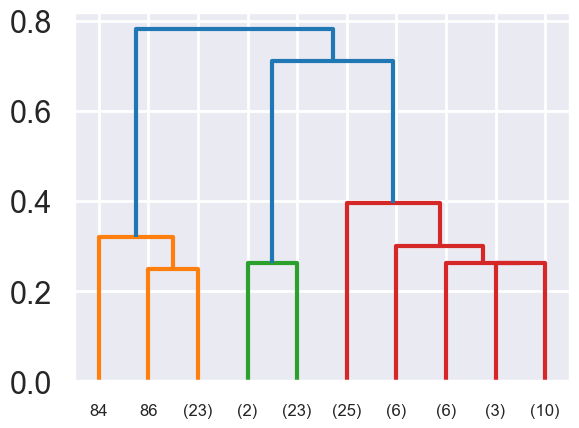

In [22]:
from scipy.cluster.hierarchy import dendrogram
model = my_SingleLinkageAglomerativeClustering(metric="euclidean", n_clusters=10) 
model.fit(test_data_0)
model.plot_dendrogram()

Try the different linkage methods implemented in `sklearn`  and comment

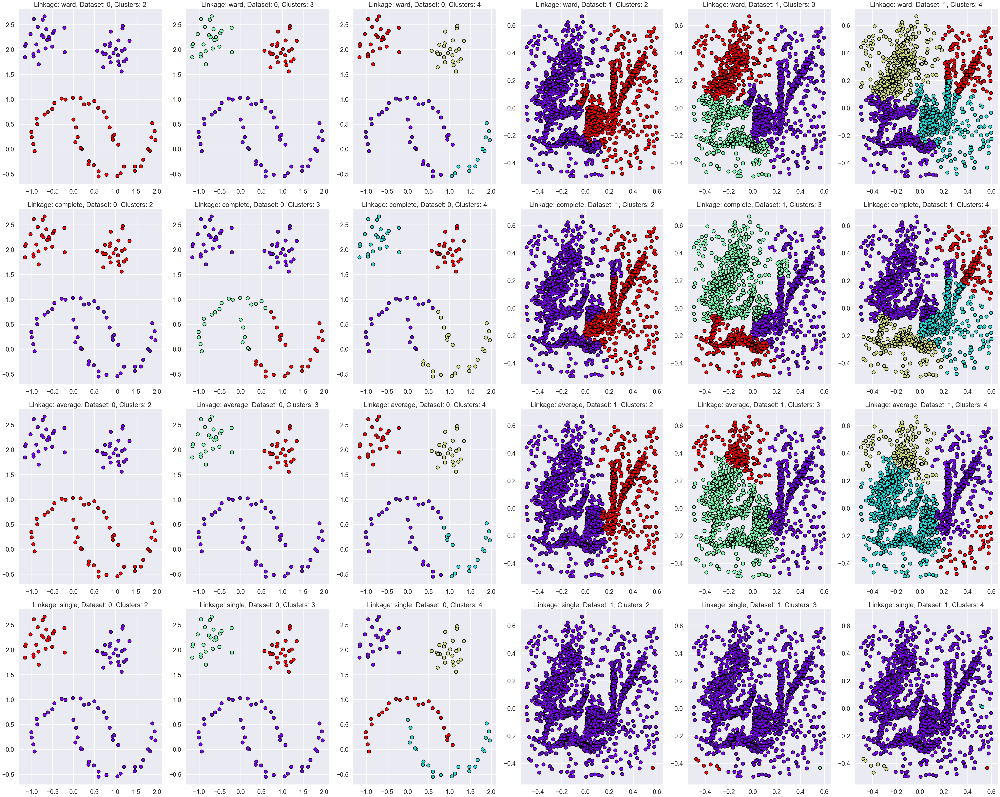

In [6]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

linkage_methods = ['ward', 'complete', 'average', 'single']
_, axes = plt.subplots(4, 6, figsize=(50, 40))

for row, method in enumerate(linkage_methods):
    for col, dataset in enumerate([test_data_0, test_data_1]):
        for nb_clusters in range(1, 4):  # Cluster numbers from 2 to 4
            # Create and fit clustering model
            cluster_model = AgglomerativeClustering(n_clusters=nb_clusters + 1, linkage=method)
            predicted_labels = cluster_model.fit_predict(dataset)

            # Select subplot axis
            axis = axes[row, col * 3 + nb_clusters - 1]
            # Scatter plot of the dataset with the predicted cluster labels
            axis.scatter(dataset[:, 0], dataset[:, 1], c=predicted_labels, cmap='rainbow', edgecolor='black')
            # Set title to describe the current clustering setup
            axis.set_title(f'Linkage: {method}, Dataset: {col}, Clusters: {nb_clusters + 1}')


plt.tight_layout()
plt.show()

Comments : for well separated data, the 'single' methods works best and $nclusters = 4$.
However, for more dense and noisy data, you may need to use more robust methods such as average distance or ward method.
They allow smoother definition of the clusters and may avoid capturing parasites by relying on several distances rather than just the min or max distance between points.

## DBSCAN

DBSCAN is a density based algorithm -- it assumes clusters for dense regions. It is also the first actual clustering algorithm we've looked at: it doesn't require that every point be assigned to a cluster and hence doesn't partition the data, but instead extracts the 'dense' clusters and leaves sparse background classified as 'noise'. In practice DBSCAN is related to agglomerative clustering. As a first step DBSCAN transforms the space according to the density of the data: points in dense regions are left alone, while points in sparse regions are moved further away. Applying single linkage clustering to the transformed space results in a dendrogram, which we cut according to a distance parameter (called epsilon or `eps` in many implementations) to get clusters. Importantly any singleton clusters at that cut level are deemed to be 'noise' and left unclustered. 

Apply it to the test_data, how do you tune the parameters?

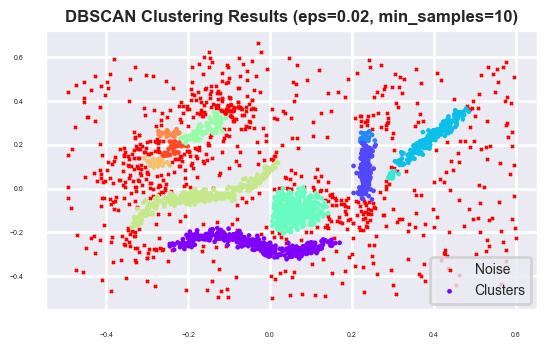

In [7]:
from sklearn.cluster import DBSCAN

# We apply DBSCAN to test_data_1 because DBSCAN assumes dense dataset, and change the params until a good fit
data = np.load('clusterable_data.npy')
epsilon = 0.02
samples_min = 10


dbscan_model = DBSCAN(eps=epsilon, min_samples=samples_min)
labels = dbscan_model.fit_predict(data)

plt.figure(figsize=(6, 4))
# labels == -1 are noise, else it is a cluster
plt.scatter(data[labels == -1, 0], data[labels == -1, 1], s=1, c='red', marker='x', label='Noise')
plt.scatter(data[labels != -1, 0], data[labels != -1, 1], s=2, c=labels[labels != -1], cmap='rainbow', label='Clusters')

plt.title(f'DBSCAN Clustering Results (eps={epsilon}, min_samples={samples_min})',fontsize=12, fontweight='bold')
plt.tick_params(axis='both', labelsize=5)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

Remark : We could also tune the parameters by doing a grid of parameters and plotting all possibilities then choose what feats best.

## HDBSCAN

HDBSCAN is a recent algorithm developed by some of the same people who write the original DBSCAN paper. Their goal was to allow varying density clusters. The algorithm starts off much the same as DBSCAN: we transform the space according to density, exactly as DBSCAN does, and perform single linkage clustering on the transformed space. Instead of taking an epsilon value as a cut level for the dendrogram however, a different approach is taken: the dendrogram is condensed by viewing splits that result in a small number of points splitting off as points 'falling out of a cluster'. This results in a smaller tree with fewer clusters that 'lose points'. That tree can then be used to select the most stable or persistent clusters. This process allows the tree to be cut at varying height, picking our varying density clusters based on cluster stability.

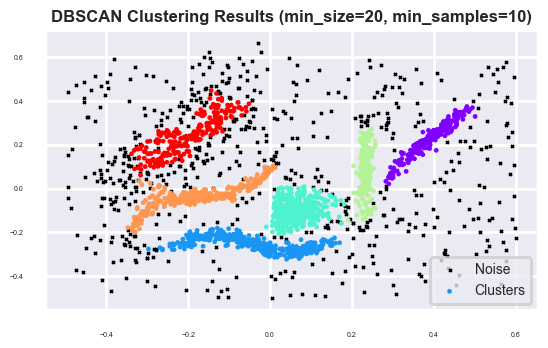

In [8]:
from sklearn.cluster import HDBSCAN

# We apply DBSCAN to test_data_1 because DBSCAN assumes dense dataset, and change the params until a good fit
data = np.load('clusterable_data.npy')

## parameters
min_cluster_size = 20  
min_samples = 10      


hdbscan_model = HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples)
labels = hdbscan_model.fit_predict(data)

plt.figure(figsize=(6, 4))
# labels == -1 are noise, else it is a cluster
plt.scatter(data[labels == -1, 0], data[labels == -1, 1], s=1, c='black', marker='x', label='Noise')
plt.scatter(data[labels != -1, 0], data[labels != -1, 1], s=2, c=labels[labels != -1], cmap='rainbow', label='Clusters')

plt.title(f'DBSCAN Clustering Results (min_size={min_cluster_size}, min_samples={min_samples})',fontsize=12, fontweight='bold')
plt.tick_params(axis='both', labelsize=5)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

Remark : choosing parameters is much easier here 

## Apply the algorithms to the following images and comment the results

### NASA Curiosity Picture

- Look at following NASA photo taken by a robot in mars:


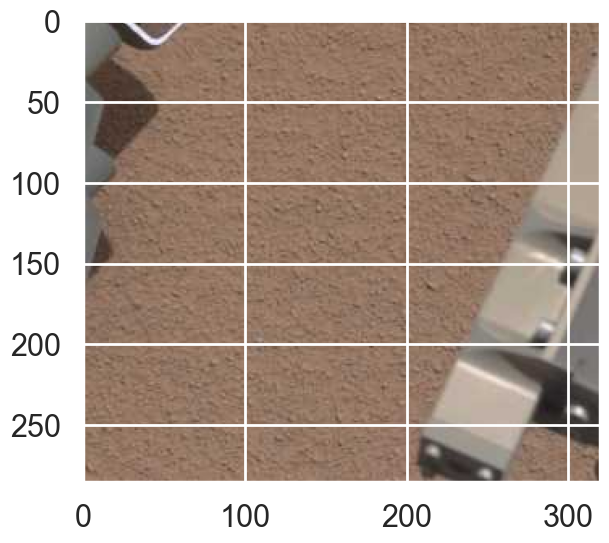

In [9]:
from PIL import Image

Im_1  = Image.open('im_nasa_reduced.jpg')

fig = plt.figure(figsize=(8, 6))
plt.imshow(Im_1)
plt.show()

- Transform the image to an intensity (I) and saturation (S) representation, it helps to distinguish bright and textures.

$$I=\frac{R+G+B}{3}$$
$$S=1-I\times min(R, G, B)$$

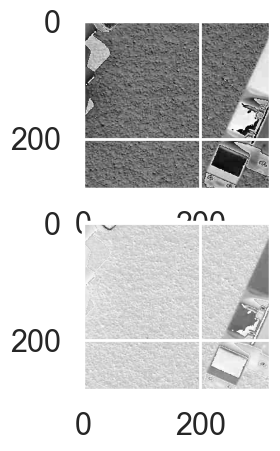

In [10]:
# Compute Intensity and Saturation
image_array = np.array(Im_1)
R, G, B = image_array[:,:,0], image_array[:,:,1], image_array[:,:,2]
I = (R + G + B) / 3
S = 1 - I * np.minimum(R, np.minimum(G, B))
height = image_array.shape[0]
width= image_array.shape[1]
# Combine Intensity and Saturation into a 2D array
data = np.column_stack((I, S))
f, axarr = plt.subplots(2,1) 
axarr[0].imshow(I,cmap = "gray")
axarr[1].imshow(S, cmap = "gray")
IS = np.column_stack((I.flatten(), S.flatten()))

- Apply the seen algorithms to segment the image in the Intensity-Saturation representation, comment the results and check if you find something on mars' surface. Be careful with hdbscan and memory errors for some parameters choice (use algorithm='boruvka_kdtree').

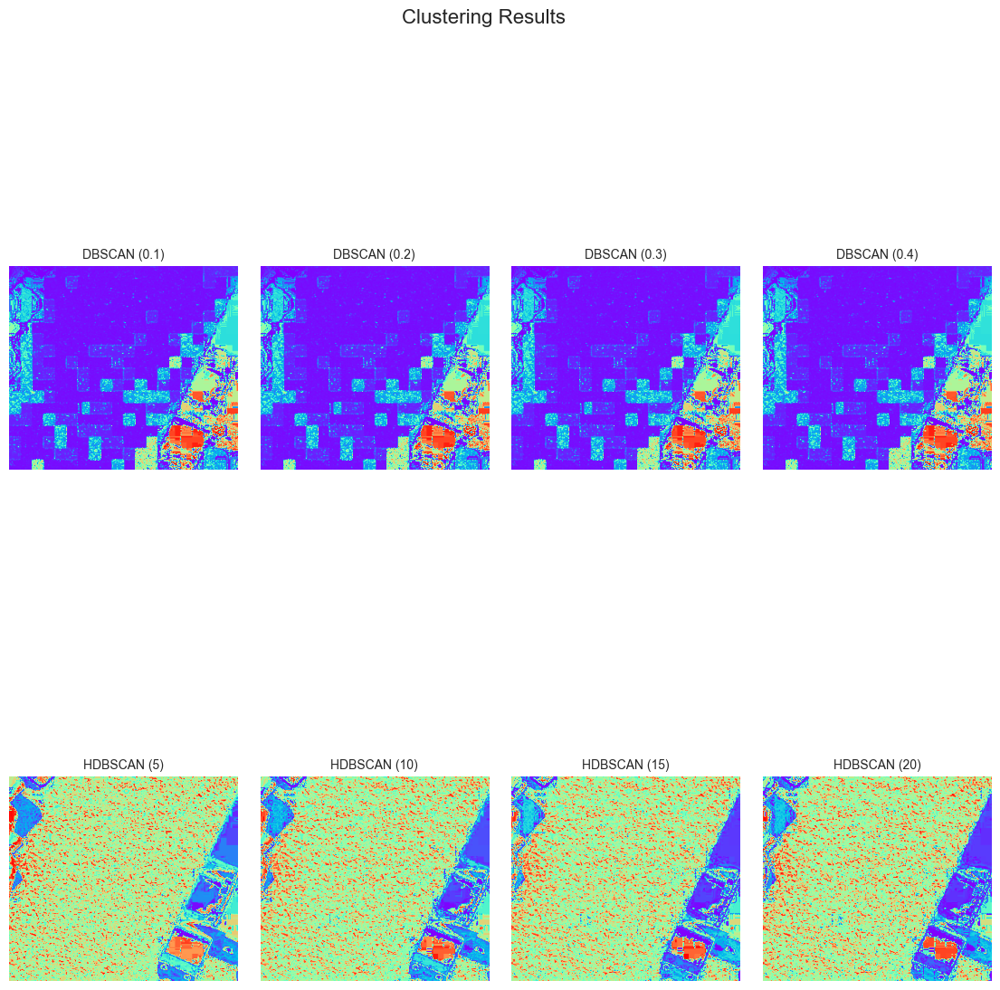

In [21]:
import matplotlib.gridspec as gridspec
# Parameters
eps_values = [0.1, 0.2, 0.3, 0.4]
min_cluster_sizes = [5, 10, 15, 20]

dbscan_labels = []
hdbscan_labels = []

# DBSCAN clustering
for eps in eps_values:
    dbscan = DBSCAN(eps=eps)
    dbscan_labels.append(dbscan.fit_predict(IS).reshape(height, width)) 

# HDBSCAN clustering
for min_cluster_size in min_cluster_sizes:
    hdbscan_cluster = HDBSCAN(min_cluster_size=min_cluster_size, algorithm='auto')
    hdbscan_labels.append(hdbscan_cluster.fit_predict(IS).reshape(height, width))  

labels_list = [dbscan_labels, hdbscan_labels]
titles = ['DBSCAN', 'HDBSCAN']
params_list = [eps_values, min_cluster_sizes]

fig = plt.figure(figsize=(14, 14))
gs = gridspec.GridSpec(2, 4, wspace=0.1, hspace=0.1)

for i, labels in enumerate(labels_list):
    for j, label in enumerate(labels):
        ax = plt.subplot(gs[i, j])
        ax.imshow(label, cmap='rainbow')  
        ax.set_title(f'{titles[i]} ({params_list[i][j]})', fontsize=10)
        ax.axis('off')

plt.suptitle('Clustering Results', fontsize=16)
plt.show()

### Color compression

One interesting application of clustering is in color compression within images. 
For example, imagine you have an image with millions of colors.
In most images, a large number of the colors will be unused, and many of the pixels in the image will have similar or even identical colors.

Get a simplified 10-colored version of the following image by applying k-means. Plot both images.

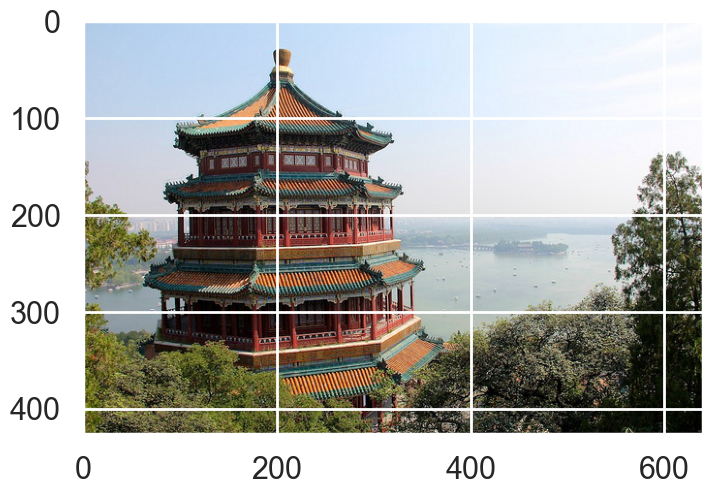

In [12]:
from sklearn.datasets import load_sample_image
china = load_sample_image("china.jpg")

fig = plt.figure(figsize=(8, 6))
plt.imshow(china);

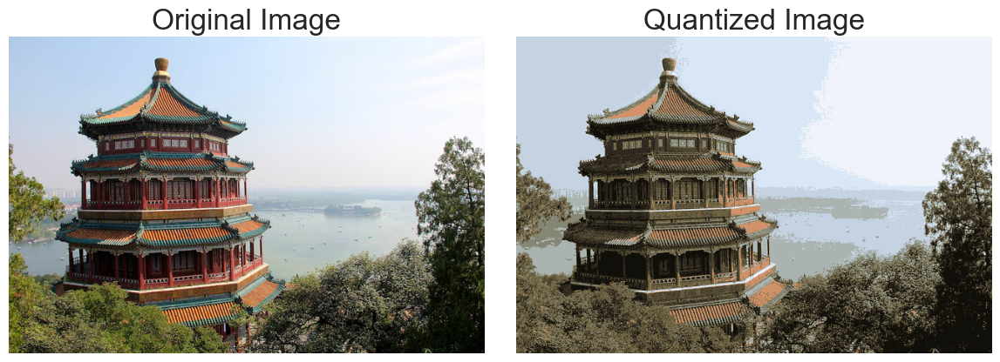

In [23]:
image_china = load_sample_image("china.jpg")  
image_china = np.array(image_china, dtype=np.float64) / 255.0  



pixels_china = image_china.reshape(-1, 3)
kmeans_model = KMeans(n_clusters=10, random_state=0).fit(pixels_china)

# Replace each pixel with the centroid 
compressed_pixels = kmeans_model.cluster_centers_[kmeans_model.labels_]
compressed_image = compressed_pixels.reshape(image_china.shape)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(image_china)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(compressed_image)
ax[1].set_title("Quantized Image")
ax[1].axis("off")

plt.tight_layout()
plt.show()